In [ ]:
#scikit-learn modules
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.svm import SVC
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score,KFold
from sklearn.preprocessing import LabelEncoder
import statsmodels.api as sm

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle

In [ ]:
# Load the dataset from Excel
data = pd.read_csv('services.csv')
#data = pd.read_excel('customer_logN.xlsx')
data.head()

,branch_id,date,queue_id,sequence,status,entity,priority,arrival_time,start_time,end_time,client_id,cashier,service_type,waiting_time
0,5,01/08/2016,73,65,finished,person,False,11:17:23,12:15:04,12:22:44,NaN,109,D,0:57:41
1,5,01/08/2016,73,224,finished,company,False,13:10:57,14:16:46,14:17:54,NaN,109,D,1:05:49
2,6,01/08/2016,34,259,finished,person,False,13:36:52,13:48:33,13:51:33,NaN,3,D,0:11:41
3,25,01/08/2016,6,40,finished,person,False,10:58:16,11:25:34,11:25:44,NaN,11,E,0:27:18
4,25,01/08/2016,6,67,finished,person,False,11:54:41,12:34:12,12:34:51,3184.0,11,E,0:39:31


In [ ]:
# Convert arrival time, waiting time, and service time to minutes
data['arrival_time'] = pd.to_datetime(data['arrival_time'], format='%H:%M:%S').dt.hour * 60 + pd.to_datetime(data['arrival_time'], format='%H:%M:%S').dt.minute
data['start_time'] = pd.to_datetime(data['start_time'], format='%H:%M:%S').dt.hour * 60 + pd.to_datetime(data['start_time'], format='%H:%M:%S').dt.minute + pd.to_datetime(data['start_time'], format='%H:%M:%S').dt.second/60
data['end_time'] = pd.to_datetime(data['end_time'], format='%H:%M:%S').dt.hour * 60 + pd.to_datetime(data['end_time'], format='%H:%M:%S').dt.minute + pd.to_datetime(data['end_time'], format='%H:%M:%S').dt.second/60
data['waiting_time'] = pd.to_datetime(data['waiting_time'], format='%H:%M:%S').dt.hour * 60 + pd.to_datetime(data['waiting_time'], format='%H:%M:%S').dt.minute
data['date'] = pd.to_datetime(data['date'], format='%d/%m/%Y')
data['date'] = data['date'].astype(int)
data.drop(columns=['client_id'], inplace=True)


In [ ]:
encoder = LabelEncoder()
data['priority'] = encoder.fit_transform(data['priority'])
data['entity'] = encoder.fit_transform(data['entity'])
data['service_type'] = encoder.fit_transform(data['service_type'])
data['status'] = encoder.fit_transform(data['status'])
data.head()

,branch_id,date,queue_id,sequence,status,entity,priority,arrival_time,start_time,end_time,cashier,service_type,waiting_time
0,5,1470009600000000000,73,65,0,1,0,677,735.066667,742.733333,109,2,57
1,5,1470009600000000000,73,224,0,0,0,790,856.766667,857.900000,109,2,65
2,6,1470009600000000000,34,259,0,1,0,816,828.550000,831.550000,3,2,11
3,25,1470009600000000000,6,40,0,1,0,658,685.566667,685.733333,11,3,27
4,25,1470009600000000000,6,67,0,1,0,714,754.200000,754.850000,11,3,39


In [ ]:
# Define a custom function to calculate queue length
def calculate_queue_length(row, data):
    return data[(data['date'] == row['date']) &
        (data['queue_id'] == row['queue_id']) &
        (data['branch_id'] == row['branch_id']) &
        (data['arrival_time'] < row['start_time'])]['arrival_time'].count()

# Apply the custom function to each row
data['queue_length'] = data.apply(calculate_queue_length, axis=1, data=data)
data.head()

,branch_id,date,queue_id,sequence,status,entity,priority,arrival_time,start_time,end_time,cashier,service_type,waiting_time,queue_length
0,5,1470009600000000000,73,65,0,1,0,677,735.066667,742.733333,109,2,57,1
1,5,1470009600000000000,73,224,0,0,0,790,856.766667,857.900000,109,2,65,2
2,6,1470009600000000000,34,259,0,1,0,816,828.550000,831.550000,3,2,11,1
3,25,1470009600000000000,6,40,0,1,0,658,685.566667,685.733333,11,3,27,1
4,25,1470009600000000000,6,67,0,1,0,714,754.200000,754.850000,11,3,39,2


In [ ]:
x = data[['date','arrival_time','cashier','queue_length','sequence','branch_id']]
y = data['waiting_time']

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state=42)

In [ ]:
#rf_model = RandomForestRegressor(n_estimators = 200, max_depth = 30, min_samples_split = 2, min_samples_leaf = 1)
rf_model = RandomForestRegressor(n_estimators = 100)
rf_model.fit(x_train, y_train)
y_pred = rf_model.predict(x_test)

In [ ]:
# Metrics
print("MAE",mean_absolute_error(y_test,y_pred))
print("MSE",mean_squared_error(y_test,y_pred))
print("RMSE",(np.sqrt(mean_squared_error(y_test,y_pred))))
print("r2", r2_score(y_test, y_pred))

MAE 3.633568056648308
MSE 37.02596904012589
RMSE 6.084896797820476
r2 0.9330204986685366


In [ ]:
pip install lime shap


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=9e6657d6a622d84c9d4a4d9664e55c437000f74bce7d50bdaa1a52cec20098ae
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [ ]:
import lime
import lime.lime_tabular
import numpy as np

# Create a LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    mode='regression',
    discretize_continuous=False
)

# Explain a single prediction (e.g., for the first test sample)
i = 0  # index of the sample to explain
lime_exp = lime_explainer.explain_instance(
    data_row=x_test.iloc[i],
    predict_fn=rf_model.predict
)

# Show the explanation
lime_exp.show_in_notebook()
# OR save as HTML
lime_exp.save_to_file('lime_rf_explanation.html')

print("Local fidelity (R²):", lime_exp.score)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


Local fidelity (R²): 0.2645368763415983


ExactExplainer explainer: 2543it [05:38,  7.39it/s]


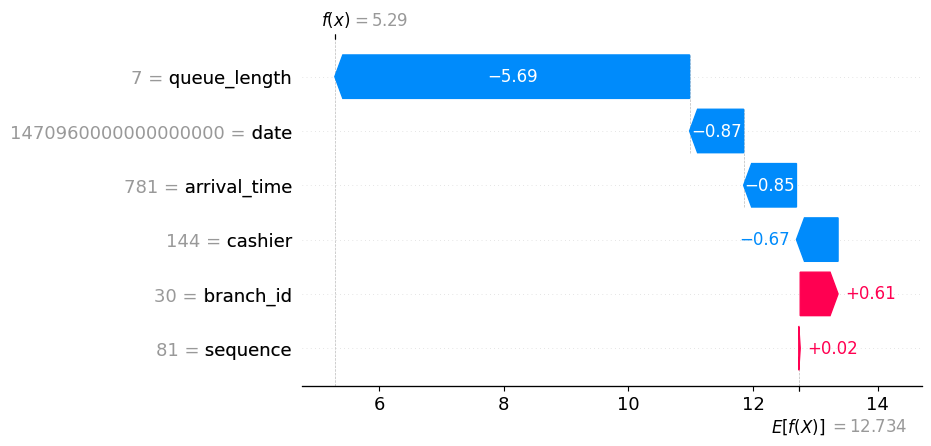

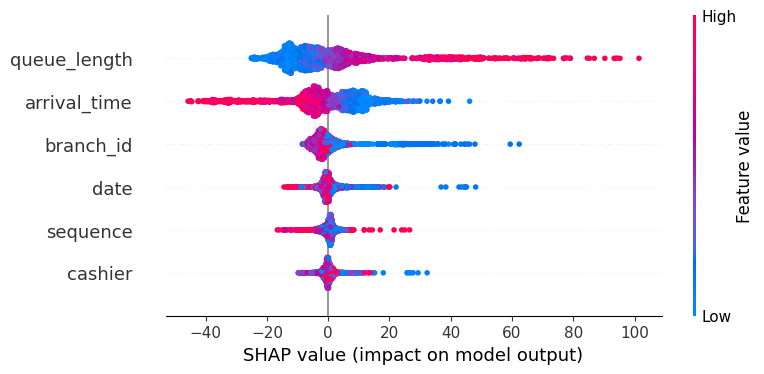

In [ ]:
import shap

# Create the SHAP explainer
shap_explainer = shap.Explainer(rf_model.predict, x_train)

# Get SHAP values for the test set
shap_values = shap_explainer(x_test)

# Visualize explanation for a single prediction
shap.plots.waterfall(shap_values[0])

# Summary plot for the whole test set
shap.plots.beeswarm(shap_values)


In [ ]:
et_model = ExtraTreesRegressor(n_estimators = 100)
et_model.fit(x_train, y_train)
y_pred = et_model.predict(x_test)

In [ ]:
# Metrics
print("MAE",mean_absolute_error(y_test,y_pred))
print("MSE",mean_squared_error(y_test,y_pred))
print("RMSE",(np.sqrt(mean_squared_error(y_test,y_pred))))
print("r2", r2_score(y_test, y_pred))

MAE 3.133139260424862
MSE 24.355792368214
RMSE 4.935158798682571
r2 0.9559406851556616


In [ ]:
import lime
import lime.lime_tabular
import numpy as np

# Create a LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    mode='regression',
    discretize_continuous=False
)

# Explain a single prediction (e.g., for the first test sample)
i = 0  # index of the sample to explain
lime_exp = lime_explainer.explain_instance(
    data_row=x_test.iloc[i],
    predict_fn=et_model.predict
)

# Show the explanation
lime_exp.show_in_notebook()
# OR save as HTML
lime_exp.save_to_file('lime_rf_explanation.html')
print("Local fidelity (R²):", lime_exp.score)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


Local fidelity (R²): 0.41525761089068625


ExactExplainer explainer: 2543it [06:04,  6.79it/s]


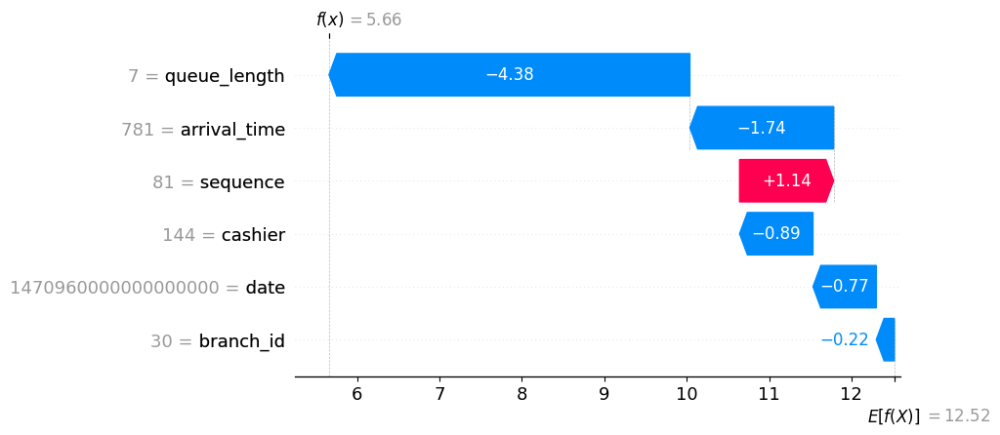

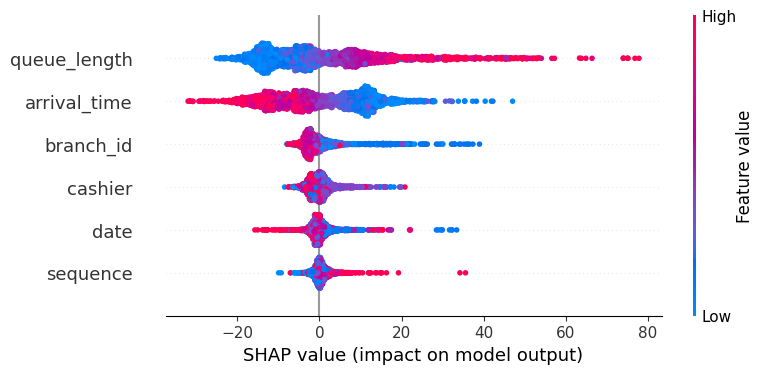

In [ ]:
import shap

# Create the SHAP explainer
shap_explainer = shap.Explainer(et_model.predict, x_train)

# Get SHAP values for the test set
shap_values = shap_explainer(x_test)

# Visualize explanation for a single prediction
shap.plots.waterfall(shap_values[0])

# Summary plot for the whole test set
shap.plots.beeswarm(shap_values)


In [ ]:
gb_model = GradientBoostingRegressor(n_estimators = 100)
gb_model.fit(x_train, y_train)
y_pred = gb_model.predict(x_test)

In [ ]:
# Metrics
print("MAE",mean_absolute_error(y_test,y_pred))
print("MSE",mean_squared_error(y_test,y_pred))
print("RMSE",(np.sqrt(mean_squared_error(y_test,y_pred))))
print("r2", r2_score(y_test, y_pred))

MAE 7.1037925283356955
MSE 119.03366533116098
RMSE 10.910255053442196
r2 0.7846696318225423


In [ ]:
import lime
import lime.lime_tabular
import numpy as np

# Create a LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    mode='regression',
    discretize_continuous=False
)

# Explain a single prediction (e.g., for the first test sample)
i = 0  # index of the sample to explain
lime_exp = lime_explainer.explain_instance(
    data_row=x_test.iloc[i],
    predict_fn=gb_model.predict
)

# Show the explanation
lime_exp.show_in_notebook()
# OR save as HTML
lime_exp.save_to_file('lime_rf_explanation.html')

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


ExactExplainer explainer: 2543it [00:27, 56.25it/s]                           


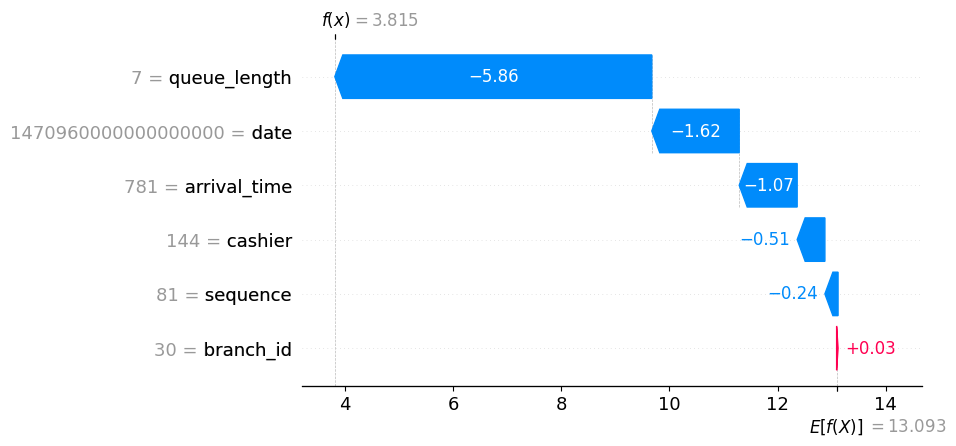

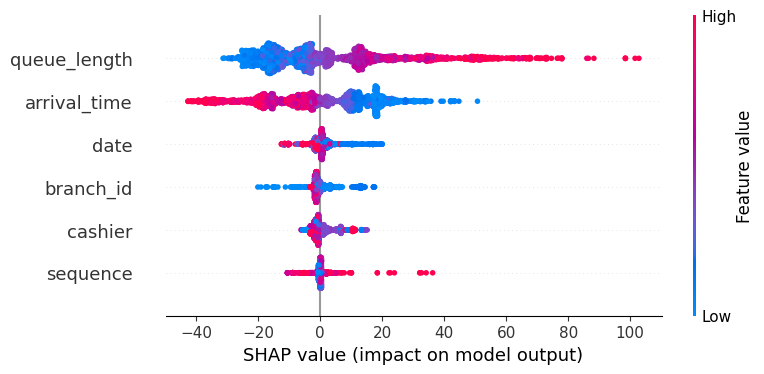

In [ ]:
import shap

# Create the SHAP explainer
shap_explainer = shap.Explainer(gb_model.predict, x_train)

# Get SHAP values for the test set
shap_values = shap_explainer(x_test)

# Visualize explanation for a single prediction
shap.plots.waterfall(shap_values[0])

# Summary plot for the whole test set
shap.plots.beeswarm(shap_values)


In [ ]:
hgb_model = HistGradientBoostingRegressor()
hgb_model.fit(x_train, y_train)
y_pred = hgb_model.predict(x_test)

In [ ]:
# Metrics
print("MAE",mean_absolute_error(y_test,y_pred))
print("MSE",mean_squared_error(y_test,y_pred))
print("RMSE",(np.sqrt(mean_squared_error(y_test,y_pred))))
print("r2", r2_score(y_test, y_pred))

MAE 5.037557231589358
MSE 53.31662401450569
RMSE 7.3018233349284545
r2 0.9035509135412876


In [ ]:
import lime
import lime.lime_tabular
import numpy as np

# Create a LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    mode='regression',
    discretize_continuous=False
)

# Explain a single prediction (e.g., for the first test sample)
i = 0  # index of the sample to explain
lime_exp = lime_explainer.explain_instance(
    data_row=x_test.iloc[i],
    predict_fn=hgb_model.predict
)

# Show the explanation
lime_exp.show_in_notebook()
# OR save as HTML
lime_exp.save_to_file('lime_rf_explanation.html')

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but HistGradientBoostingRegressor was fitted with feature names
  warnings.warn(


ExactExplainer explainer: 2543it [02:49, 14.11it/s]


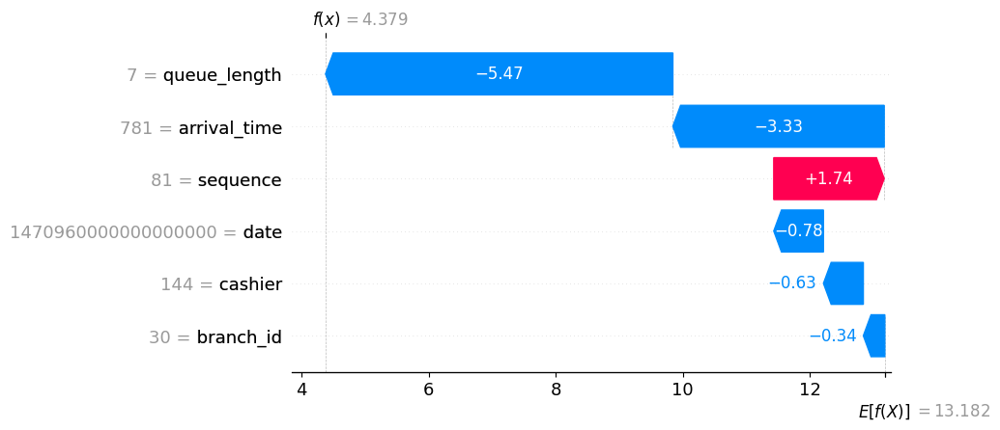

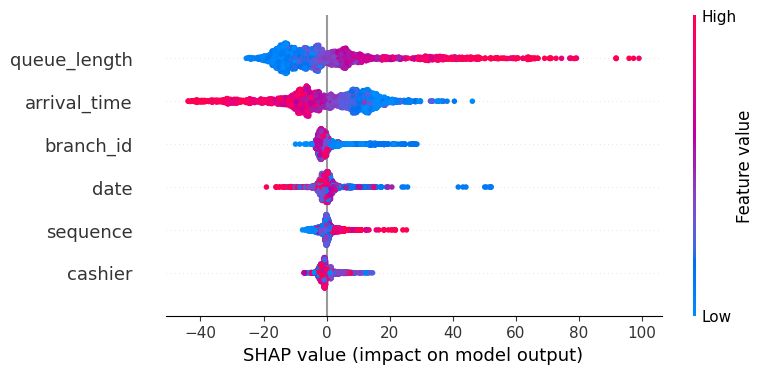

In [ ]:
import shap

# Create the SHAP explainer
shap_explainer = shap.Explainer(hgb_model.predict, x_train)

# Get SHAP values for the test set
shap_values = shap_explainer(x_test)

# Visualize explanation for a single prediction
shap.plots.waterfall(shap_values[0])

# Summary plot for the whole test set
shap.plots.beeswarm(shap_values)


In [ ]:
r1 = LinearRegression()
r2 = RandomForestRegressor(n_estimators=100)
r3 = KNeighborsRegressor()
vr_model = VotingRegressor([('lr', r1), ('rf', r2), ('r3', r3)])
vr_model.fit(x_train, y_train)
y_pred = vr_model.predict(x_test)

In [ ]:
# Metrics
print("MAE",mean_absolute_error(y_test,y_pred))
print("MSE",mean_squared_error(y_test,y_pred))
print("RMSE",(np.sqrt(mean_squared_error(y_test,y_pred))))
print("r2", r2_score(y_test, y_pred))

MAE 6.659584841538801
MSE 96.75587891812285
RMSE 9.836456624116371
r2 0.8249698606456438


In [ ]:
import lime
import lime.lime_tabular
import numpy as np

# Create a LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    mode='regression',
    discretize_continuous=False
)

# Explain a single prediction (e.g., for the first test sample)
i = 0  # index of the sample to explain
lime_exp = lime_explainer.explain_instance(
    data_row=x_test.iloc[i],
    predict_fn=vr_model.predict
)

# Show the explanation
lime_exp.show_in_notebook()
# OR save as HTML
lime_exp.save_to_file('lime_rf_explanation.html')

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(


ExactExplainer explainer: 2543it [08:27,  4.91it/s]


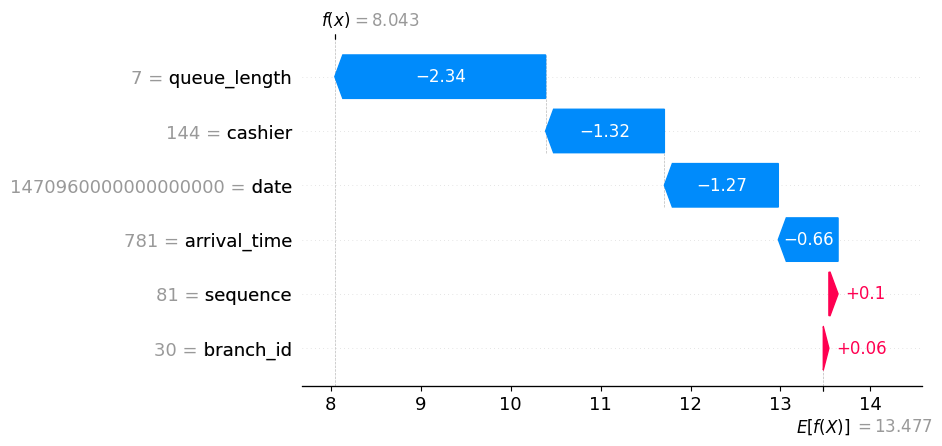

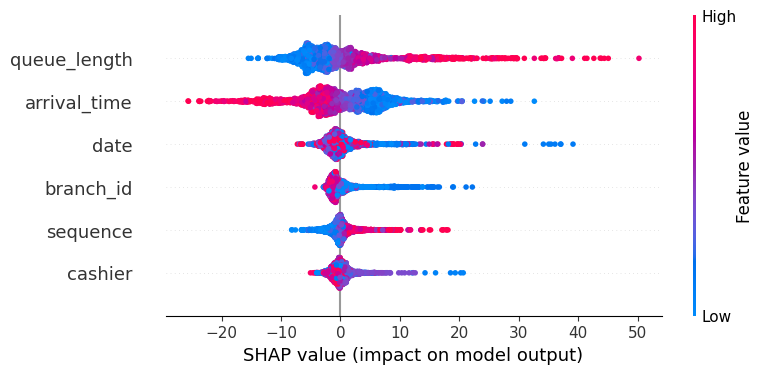

In [ ]:
import shap

# Create the SHAP explainer
shap_explainer = shap.Explainer(vr_model.predict, x_train)

# Get SHAP values for the test set
shap_values = shap_explainer(x_test)

# Visualize explanation for a single prediction
shap.plots.waterfall(shap_values[0])

# Summary plot for the whole test set
shap.plots.beeswarm(shap_values)